In [39]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.constants import g

In [40]:
# add root folder to path
import sys
sys.path.append('../')

from utility import plots
plots.set_style()

# Visualizing HW3 Equations of Motions

In [41]:
# some common useful functions

def spherical_to_cartesian(r, theta, phi):
    x = r * np.sin(theta) * np.cos(phi)
    y = r * np.sin(theta) * np.sin(phi)
    z = r * np.cos(theta)
    return np.array([x, y, z])

def cartesian_to_spherical(x, y, z):
    r = np.sqrt(x**2 + y**2 + z**2)
    theta = np.arccos(z / r)
    phi = np.arctan2(y, x)
    return np.array([r, theta, phi])

# 7.15 - Spring Pendulum

## Coupled System of Differential Eqs

$\ddot{r} - r \dot{\theta}^2 + \frac{k}{m} (r - b) - g \cos{\theta} = 0$ \
$\ddot{\theta} + \frac{2}{r}\dot{r}\dot{\theta} + \frac{g}{r} \sin{\theta} = 0$ \
\
Need system of equations in term's of first order D.Es for scipy.odeint \
Let\
$ \theta_1 = \theta$, $\theta_2 = \dot{\theta}$, $r_1 = r$, and $r_2 = \dot{r}$ \
\
Therefore, the system of 2nd order D.Es can be rewritten:\
$\dot{r_2}=  r_1 \theta^2_2 - \frac{k}{m} (r_1 - b) + g \cos{\theta_1}$ \
$\dot{\theta_2} = - \frac{2}{r_1}r_2 \theta_2 - \frac{g}{r_1} \sin{\theta_1} $ \
$\dot{r_1} = r_2$ \
$\dot{\theta_1} = \theta_2$


In [42]:
# define the system of ODEs
def dSdt(t, S, k, m, b):
    r1, r2, theta1, theta2 = S
    dr1dt = r2
    dr2dt = r1 * theta2**2 - k/m * (r1 - b) + g*np.cos(theta1)
    dtheta1dt = theta2
    dtheta2dt = -2 * r2 * theta2 / r1 - g * np.sin(theta1) / r1
    return [dr1dt, dr2dt, dtheta1dt, dtheta2dt]

In [43]:
# define parameters and initial conditions
k = 5
m = 1
b = 0.5

r1_0 = 1 # initially unstretched
r2_0 = 2 # initially at rest

theta1_0 = np.pi/2 # initially at the horizontal
theta2_0 = 0 # initially at rest

S_0 = [r1_0, r2_0, theta1_0, theta2_0]

In [44]:
# solve the system of ODEs
t_span = (0, 10)
fps = 60
t_eval = np.arange(0, 10, 1/fps)

sol = solve_ivp(dSdt, t_span, S_0, args=(k, m, b), t_eval=t_eval)

In [45]:
# convert to cartesian coordinates
x = sol.y[0] * np.sin(sol.y[2])
y = -sol.y[0] * np.cos(sol.y[2])

(-5.0, 2.0)

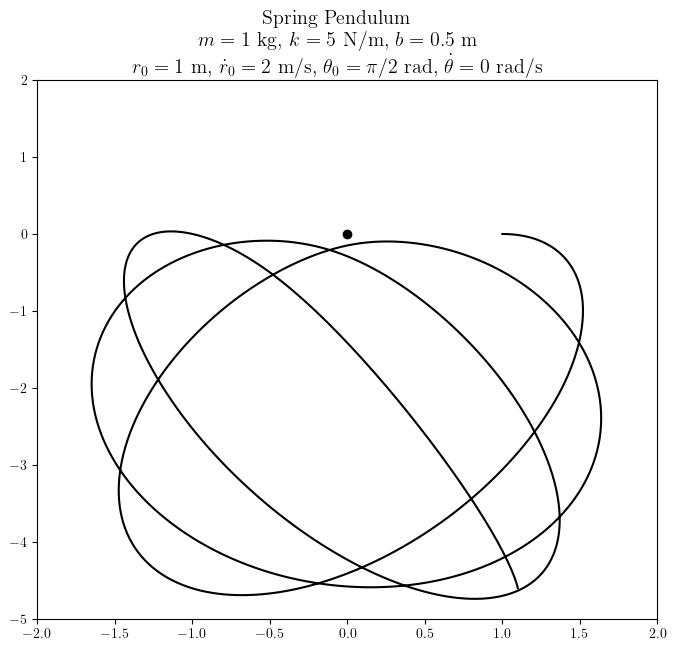

In [46]:
# plot the results
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

fig.suptitle(f'''Spring Pendulum
$m = {m}$ kg, $k = {k}$ N/m, $b = {b}$ m
$r_0 = {r1_0}$ m, $\\dot{{r}}_0 = {r2_0}$ m/s, $\\theta_0 = \\pi/2$ rad, $\\dot{{\\theta}} = {theta2_0}$ rad/s''')

# plot center
ax.plot(0, 0, 'ko')

# plot the pendulum
ax.plot(x, y, 'k')

# set limits
ax.set_xlim(-2, 2)
ax.set_ylim(-5, 2)

In [47]:
# animation time!
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

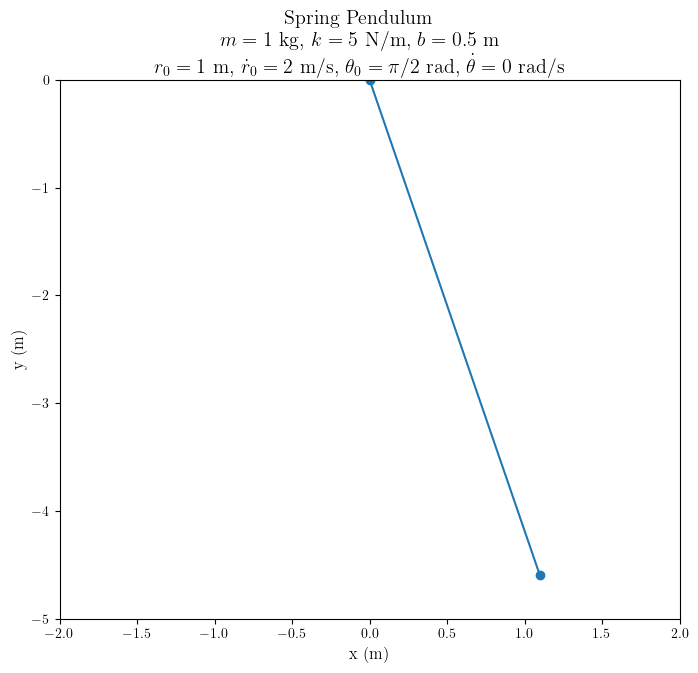

In [48]:
# plot the results
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

xdata, ydata = [], []
ln, = plt.plot([], [], '-o')

fig.suptitle(f'''Spring Pendulum
$m = {m}$ kg, $k = {k}$ N/m, $b = {b}$ m
$r_0 = {r1_0}$ m, $\\dot{{r}}_0 = {r2_0}$ m/s, $\\theta_0 = \\pi/2$ rad, $\\dot{{\\theta}} = {theta2_0}$ rad/s''')
ax.set_xlabel('x (m)')
ax.set_ylabel('y (m)')

def init():
    ax.set_xlim(-2, 2)
    ax.set_ylim(-5, 0)
    return ln,

def update(frame):
    x_line = np.array([0, x[frame]])
    y_line = np.array([0, y[frame]])
    ln.set_data(x_line, y_line)
    return ln,

ani = FuncAnimation(fig, update, frames=len(x), init_func=init, blit=True, interval=1000/fps, repeat=False)

HTML(ani.to_jshtml())

In [49]:
# # save animation to gif
# from matplotlib import animation

# mywriter = animation.FFMpegWriter(fps=fps)
# ani.save('spring_pendulum.mp4', writer=mywriter)